In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt
import plotly.express as px
plt.style.use('fivethirtyeight')

,Date,Time,Transaction_id,Menu,Quantity,Price,Revenue,Week_day,Day,Year,Month,Quarter,Day_time
0,2021-01-02,08:38,150040,Baguette,1,0.90,0.90,Saturday,2,2021,2021-01,2021Q1,Morning
1,2021-01-02,08:38,150040,Pain Au Chocolat,3,1.20,3.60,Saturday,2,2021,2021-01,2021Q1,Morning
2,2021-01-02,09:14,150041,Pain Au Chocolat,2,1.20,2.40,Saturday,2,2021,2021-01,2021Q1,Morning
3,2021-01-02,09:14,150041,Pain,1,1.15,1.15,Saturday,2,2021,2021-01,2021Q1,Morning
4,2021-01-02,09:25,150042,Traditional Baguette,5,1.20,6.00,Saturday,2,2021,2021-01,2021Q1,Morning


In [3]:
df_clean = pd.read_csv('../clean_data/clean_bakery_sales.csv', index_col=0)
df_clean.head()

,Date,Time,Transaction_id,Menu,Quantity,Price,Revenue,Week_day,Day,Year,Month,Quarter,Day_time
0,2021-01-02,08:38,150040,Baguette,1,0.90,0.90,Saturday,2,2021,2021-01,2021Q1,Morning
1,2021-01-02,08:38,150040,Pain Au Chocolat,3,1.20,3.60,Saturday,2,2021,2021-01,2021Q1,Morning
2,2021-01-02,09:14,150041,Pain Au Chocolat,2,1.20,2.40,Saturday,2,2021,2021-01,2021Q1,Morning
3,2021-01-02,09:14,150041,Pain,1,1.15,1.15,Saturday,2,2021,2021-01,2021Q1,Morning
4,2021-01-02,09:25,150042,Traditional Baguette,5,1.20,6.00,Saturday,2,2021,2021-01,2021Q1,Morning


## Identifica Outliers

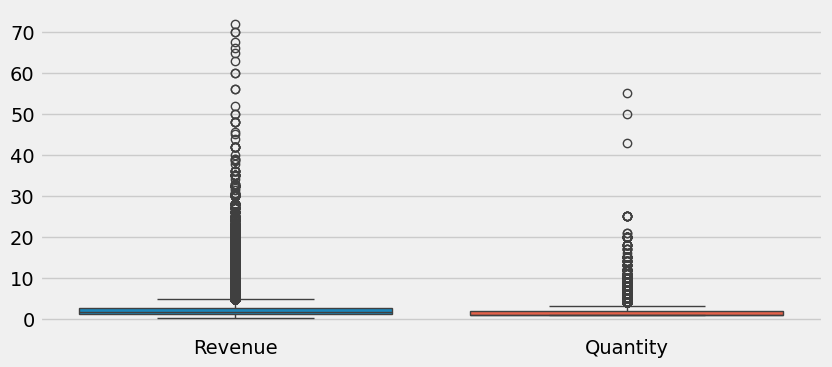

In [4]:
# Identifica outliers
plt.figure(figsize = (9, 4))
outlier = pd.DataFrame(data=df_clean, columns = ['Revenue', 'Quantity'])
sns.boxplot(data=outlier)
plt.show()

En la primera versión de este EDA observamos ourliers con valor negativo y otros con más de cien panes vendidos. Decidimos eliminar los outliers en el etl

## Heatmap de correlaciones

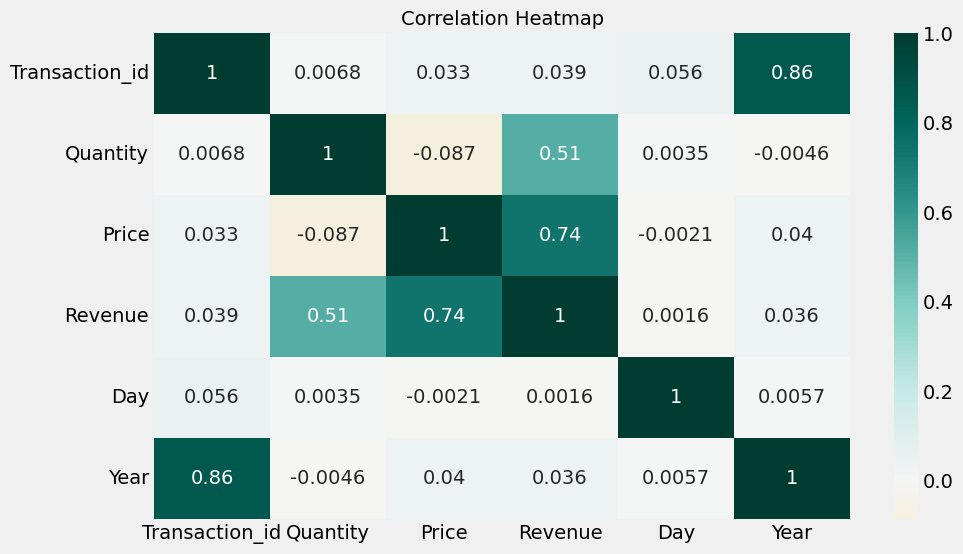

In [5]:
plt.figure(figsize = (10,6))
heatmap = sns.heatmap(df_clean.corr(numeric_only=True), annot=True, cmap='BrBG', center=0)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':14})
plt.show()

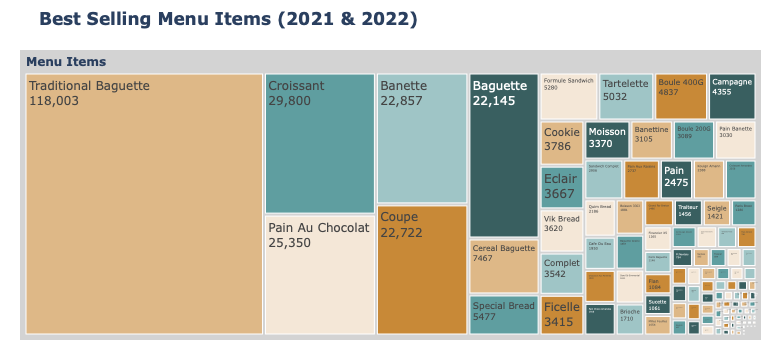

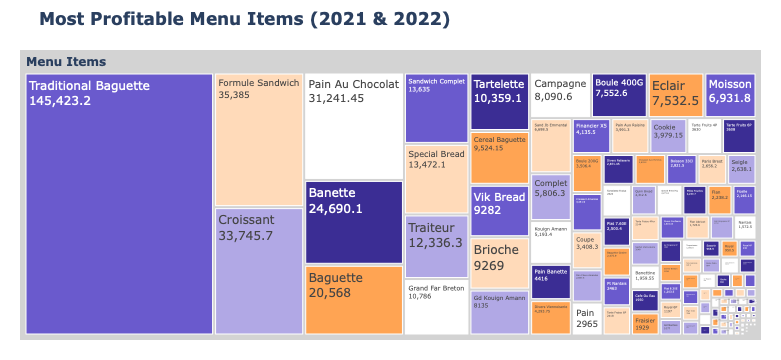

In [6]:
# Best Selling Menu Items
fig = px.treemap(data_frame=df_clean, 
                path=[px.Constant('<b> Menu Items'), 
                      'Menu'], 
                title = '<b> Best Selling Menu Items (2021 & 2022)',
                values= 'Quantity')

fig.data[0].textinfo = 'label+text+value'

fig.update_traces(root_color='lightgrey')
 
fig.update_layout(treemapcolorway = ['burlywood', 'cadetblue'], 
                  margin = dict(t=50, l=20, r=20, b=20))

fig.layout.hovermode = False
fig.show()


#  Most Profitable Menu Items
fig = px.treemap(data_frame=df_clean, 
                path=[px.Constant('<b> Menu Items'), 
                      'Menu'], 
                title = '<b> Most Profitable Menu Items (2021 & 2022)',
                values='Revenue')

fig.data[0].textinfo = 'label+text+value'

fig.update_traces(root_color='lightgrey')
 
fig.update_layout(treemapcolorway = ['slateblue', 'peachpuff'], 
                  margin = dict(t=50, l=20, r=20, b=20))

fig.layout.hovermode = False
fig.show()

/var/folders/mn/vp70xqd126nc7g0318l132mh0000gp/T/ipykernel_79948/2766005256.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/var/folders/mn/vp70xqd126nc7g0318l132mh0000gp/T/ipykernel_79948/2766005256.py:7: UserWarning:


The palette list has fewer values (20) than needed (21) and will cycle, which may produce an uninterpretable plot.



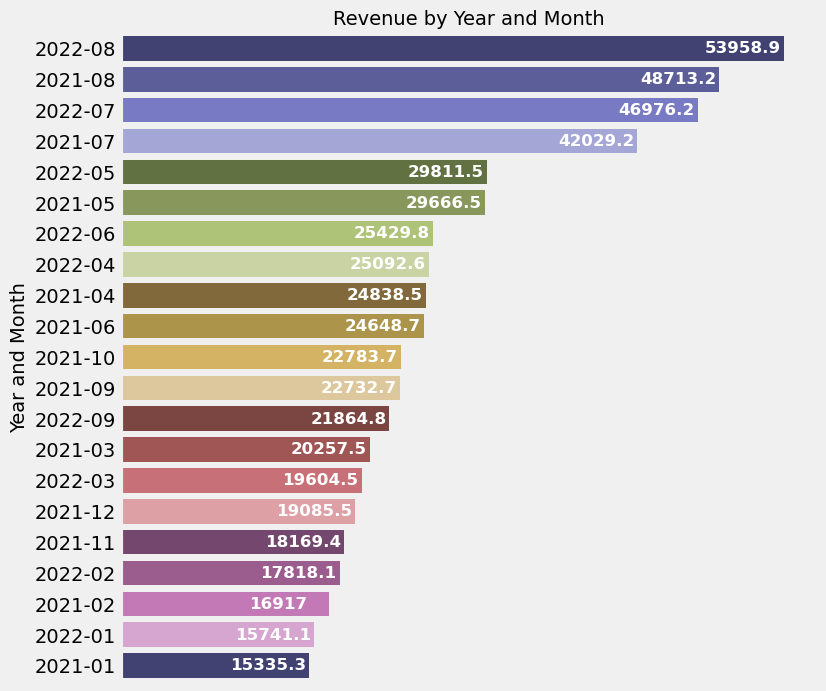

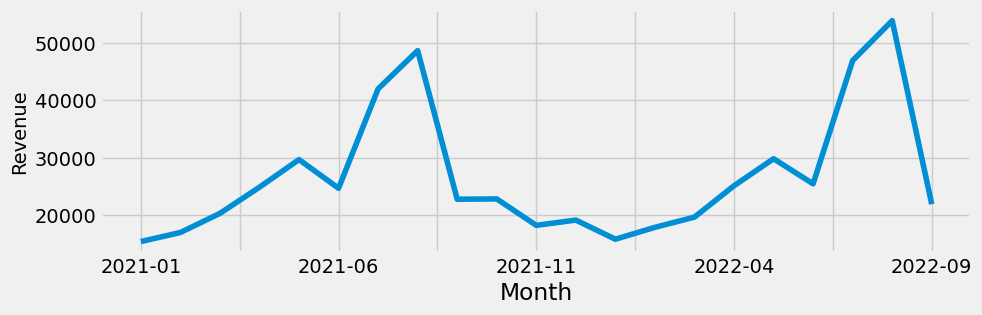

In [9]:
# Revenue by Month
rev_month = df_clean.groupby(['Month'])['Revenue'].sum()\
                                            .reset_index()\
                                            .sort_values(by='Revenue', ascending=False)
fig = plt.figure(figsize = (8,8))
color = sns.color_palette('tab20b')
ax = sns.barplot(data=rev_month, x='Revenue', y='Month', palette=color, orient='h')

for i in ax.containers:
    ax.bar_label(i, padding=-57, color='white', 
             fontsize=12, label_type='edge',
            fontweight='bold')


plt.ylabel('Year and Month', size=14)
plt.title('Revenue by Year and Month', size=14)

ax.spines[['right', 'top', 'bottom']].set_visible(False) 
ax.xaxis.set_visible(False)
plt.show()


plt.figure(figsize = (10,3))
df_clean.groupby(['Month'])['Revenue'].sum().plot()
plt.ylabel('Revenue', size=14)
plt.show()

/var/folders/mn/vp70xqd126nc7g0318l132mh0000gp/T/ipykernel_79948/3162418560.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/var/folders/mn/vp70xqd126nc7g0318l132mh0000gp/T/ipykernel_79948/3162418560.py:7: UserWarning:


The palette list has fewer values (6) than needed (7) and will cycle, which may produce an uninterpretable plot.



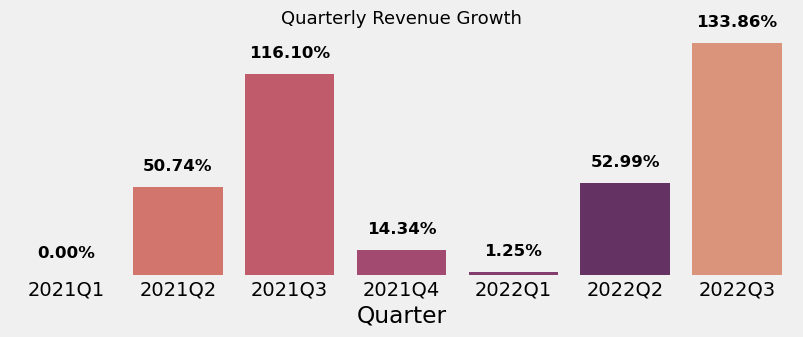

In [10]:
# Quarterly Revenue Growth
rev_quarter = df_clean.groupby(df_clean['Quarter'])['Revenue'].sum()
rev_growth = (rev_quarter / rev_quarter.iloc[0] - 1) * 100

fig = plt.figure(figsize=(9, 3))
color = sns.color_palette('flare')
ax = sns.barplot(data=rev_growth.reset_index(), x='Quarter', y='Revenue', palette=color)

for i in ax.containers:
    ax.bar_label(i, padding=10, color='black', fontsize=12, label_type='edge',
                 fontweight='bold', fmt='%.2f%%')

plt.title('Quarterly Revenue Growth', size=13)

ax.spines[['left', 'top', 'bottom']].set_visible(False)
ax.yaxis.set_visible(False)
# ax.xaxis.set_visible(False)

plt.show()

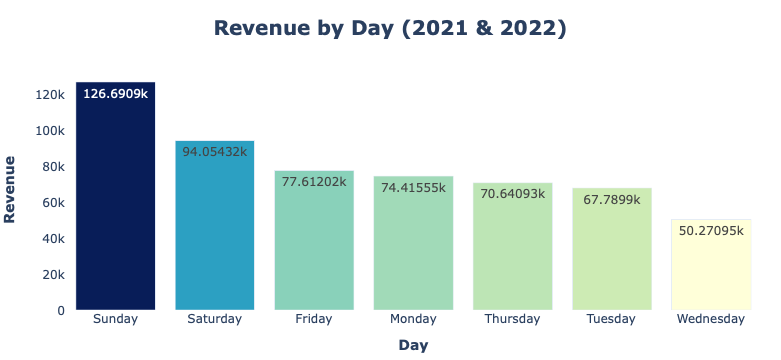

In [12]:
# Revenue by Day
profitable_menu = df_clean.groupby('Week_day').sum(numeric_only=True)['Revenue'].sort_values(ascending=False)

fig = px.bar(profitable_menu, 
             color=profitable_menu, 
             color_continuous_scale=px.colors.sequential.YlGnBu)

fig.update_layout(margin=dict(t=70, b=10, l=20, r=20),
                  title='<b> Revenue by Day (2021 & 2022)', title_x = 0.5, 
                  titlefont=dict(size=20), 
                  xaxis_tickangle=-0, 
                  yaxis = {'categoryorder':'total ascending'},
                  plot_bgcolor='white', 
                  coloraxis_showscale=False)

fig.update_yaxes(showticklabels=True, 
                 title='<b> Revenue')
fig.update_xaxes(title='<b> Day')
fig.update_traces(texttemplate='%{y}', 
                  textposition='inside',
                  hovertemplate = '<b>%{x}</b><br>Revenue: %{y}')
fig.show()

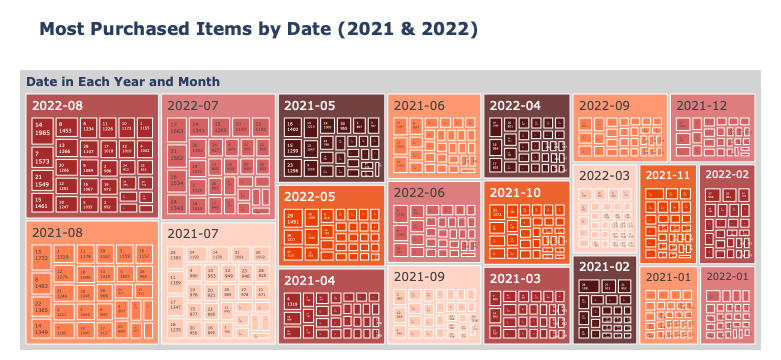

In [13]:
# Most Purchased Items by Date
fig = px.treemap(data_frame=df_clean, 
                path=[px.Constant('<b> Date in Each Year and Month'), 
                      'Month', 
                      'Day'], 
                title = '<b> Most Purchased Items by Date (2021 & 2022)',
                values='Quantity')

fig.data[0].textinfo = 'label+text+value'

fig.update_traces(root_color='lightgrey')
 
fig.update_layout(treemapcolorway = ['brown', 'coral'], 
                  margin = dict(t=70, b=10, l=20, r=20))

fig.layout.hovermode = False
fig.show()

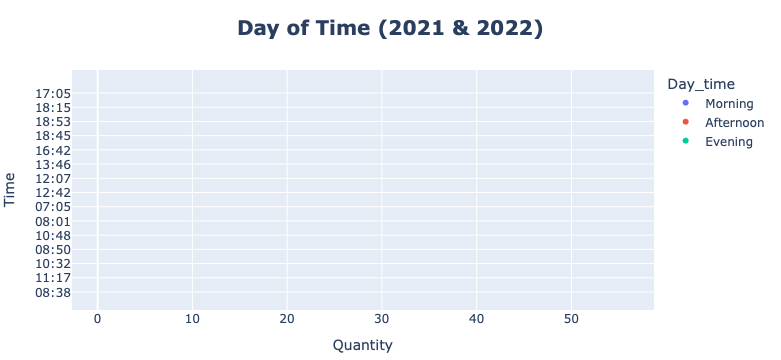

In [14]:
# Day of time distribution
fig = px.scatter(df_clean, x='Quantity', y='Time', color='Day_time')
fig.update_layout(margin=dict(t=70, b=10, l=20, r=20),
                  title='<b> Day of Time (2021 & 2022)', title_x = 0.5, 
                  titlefont=dict(size=20))
fig.show()